<a href="https://colab.research.google.com/github/pinkcoder718/Projects_main/blob/main/Auto_Music_generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!python --version

Python 3.7.13


In [ ]:
# dependencies

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2

import tensorflow as tf

import random
import IPython
from IPython.display import Image, Audio

import music21
from music21 import *

from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Loading the data

os.listdir('/content/drive/MyDrive/data')

['granados',
 'tschai',
 'schubert',
 'schumann',
 'mendelssohn',
 'liszt',
 'haydn',
 'muss',
 'grieg',
 'mozart',
 'albeniz',
 'borodin',
 'debussy',
 'burgm',
 'chopin',
 'balakir',
 'beeth',
 'brahms',
 'bach']

In [ ]:
print("The number of midi files in albeniz: ", len(os.listdir('/content/drive/MyDrive/data/albeniz/')))

The number of midi files in albeniz:  14


In [ ]:
root_path = '/content/drive/MyDrive/data/'
n_dir = []
for dir in os.listdir(root_path):
  folder_dir = os.listdir('/content/drive/MyDrive/data')
  n_dir.append(len(os.listdir(os.path.join(root_path,dir))))

In [ ]:
df = pd.DataFrame({'Artist':folder_dir, 
                   'Number of MIDI':n_dir})

df

,Artist,Number of MIDI
0,granados,3
1,tschai,12
2,schubert,29
3,schumann,24
4,mendelssohn,15
5,liszt,16
6,haydn,21
7,muss,8
8,grieg,16
9,mozart,21


In [ ]:
print("The total number of MIDI files in the dataset: ", sum(n_dir))

The total number of MIDI files in the dataset:  295


**Exploratory Data Analysis**

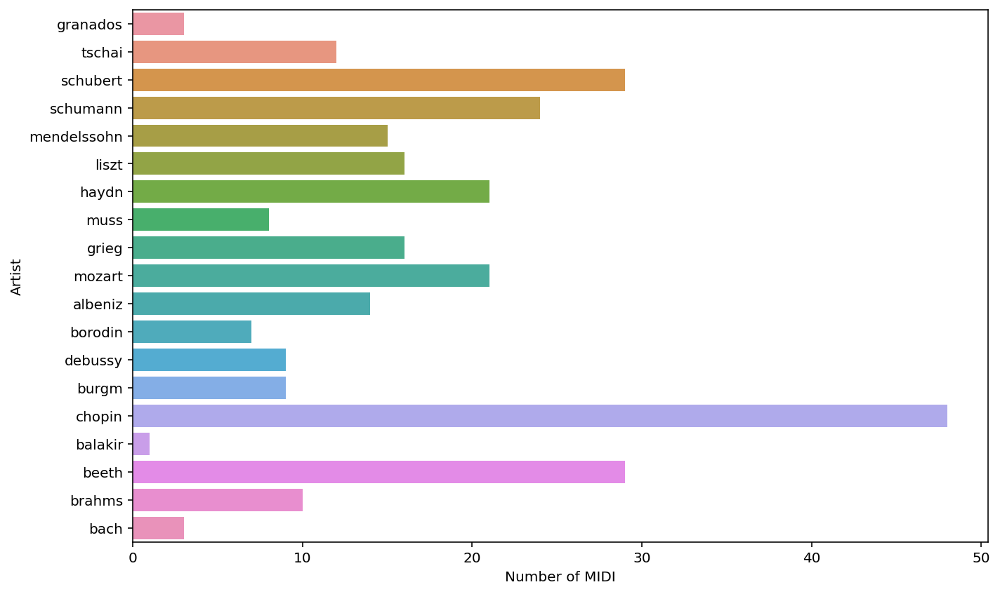

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(y='Artist',x='Number of MIDI', data = df)
plt.tight_layout()

In [ ]:
root_path = '/content/drive/MyDrive/data/'
n_dir2 = []
for dir in os.listdir(root_path):
  folder_dir = os.listdir('/content/drive/MyDrive/data')
  n_dir2.append(os.listdir(os.path.join(root_path,dir)))

In [ ]:
all_midis= []
for i in os.listdir('/content/drive/MyDrive/data/albeniz/'):
    if i.endswith(".mid"):
        tr = '/content/drive/MyDrive/data/albeniz/' + i
        midi = converter.parse(tr)
        all_midis.append(midi)

In [ ]:
all_midis

[<music21.stream.Score 0x7fdfabd09990>,
 <music21.stream.Score 0x7fdfaaf4dd10>,
 <music21.stream.Score 0x7fdfaa71c810>,
 <music21.stream.Score 0x7fdfab078110>,
 <music21.stream.Score 0x7fdfaa3d37d0>,
 <music21.stream.Score 0x7fdfaa3a7b10>,
 <music21.stream.Score 0x7fdfa9034fd0>,
 <music21.stream.Score 0x7fdfa8f8f710>,
 <music21.stream.Score 0x7fdfa73a7b90>,
 <music21.stream.Score 0x7fdfa780bf50>,
 <music21.stream.Score 0x7fdfa6a7de90>,
 <music21.stream.Score 0x7fdfa925a550>,
 <music21.stream.Score 0x7fdfa693e690>,
 <music21.stream.Score 0x7fdfa55d3050>]

In [ ]:
def extract_notes(file):
    notes = []
    pick = None
    for j in file:
        songs = instrument.partitionByInstrument(j)
        for part in songs.parts:
            pick = part.recurse()
            for element in pick:
                if isinstance(element, note.Note):
                    notes.append(str(element.pitch))
                elif isinstance(element, chord.Chord):
                    notes.append(".".join(str(n) for n in element.normalOrder))

    return notes

Corpus = extract_notes(all_midis)
print("Total notes in all the Albeniz midis in the dataset:", len(Corpus))

Total notes in all the Albeniz midis in the dataset: 18419


So we have our data in the form of a corpus. A list of strings, if you will. Each string indicates a musical note. Let us explore this data corpus.

In [ ]:
print("First fifty values in the Corpus:", Corpus[:5])

First fifty values in the Corpus: ['2', 'A3', '2.6.9', '9', '2', 'A3', '2.6.9', '9', '9.2', 'F#4', 'D3', 'F#4', 'F#4', '6.9', 'G#3', 'G4', 'A3', 'F#4', 'A2', '2.6.9', 'D3', 'G#3', 'A3', 'F#4', 'D5', 'A2', 'E5', 'F#4', 'F#5', 'D3', 'C#5', 'E5', 'G#3', 'D5', 'A3', 'F4', 'B4', 'E-3', 'F#4', '1.7', 'E3', 'G#3', 'A3', '4.7', 'A2', '6.9', '7.11', 'C#3', '9.1', 'G#3']


In [ ]:
!apt-get install -y lilypond

**Printing the music sheet**

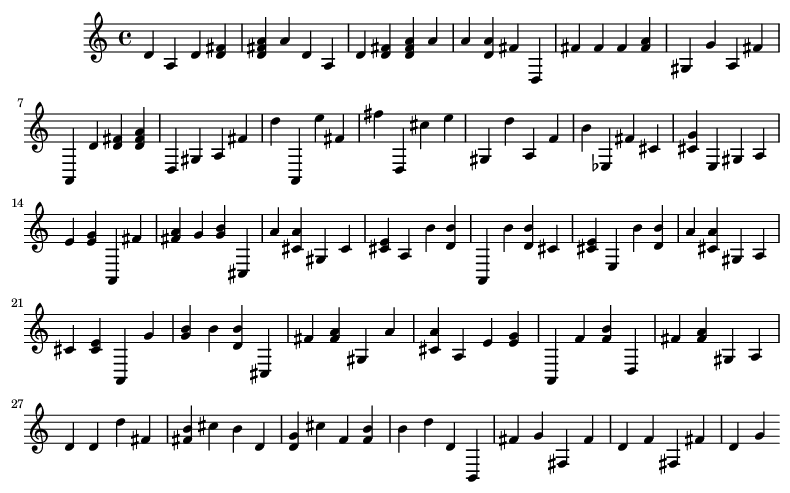

In [ ]:
def show(music):
    display(Image(str(music.write("lily.png"))))
    
def chords_n_notes(Snippet):
    Melody = []
    offset = 0 #Incremental
    for i in Snippet:
        #If it is chord
        if ("." in i or i.isdigit()):
            chord_notes = i.split(".") #Seperating the notes in chord
            notes = [] 
            for j in chord_notes:
                inst_note=int(j)
                note_snip = note.Note(inst_note)            
                notes.append(note_snip)
                chord_snip = chord.Chord(notes)
                chord_snip.offset = offset
                Melody.append(chord_snip)
        # pattern is a note
        else: 
            note_snip = note.Note(i)
            note_snip.offset = offset
            Melody.append(note_snip)
            # increase offset each iteration so that notes do not stack
        offset += 1
    Melody_midi = stream.Stream(Melody)   
    return Melody_midi

Melody_Snippet = chords_n_notes(Corpus[:100])
show(Melody_Snippet)

**Playing the above sheet music**

In [ ]:
!pip install midi2audio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!sudo apt-get install fluidsynth

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'sudo apt autoremove' to remove it.
The following additional packages will be installed:
  fluid-soundfont-gm libfluidsynth1 libqt5x11extras5 qsynth
Suggested packages:
  fluid-soundfont-gs timidity jackd
The following NEW packages will be installed:
  fluid-soundfont-gm fluidsynth libfluidsynth1 libqt5x11extras5 qsynth
0 upgraded, 5 newly installed, 0 to remove and 49 not upgraded.
Need to get 120 MB of archives.
After this operation, 150 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 fluid-soundfont-gm all 3.1-5.1 [119 MB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libfluidsynth1 amd64 1.1.9-1 [137 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 fluidsynth amd64 1.1.9-1 [20.7 kB]
Get:4 http://archi

In [ ]:
from midi2audio import FluidSynth
FluidSynth().play_midi('/content/drive/MyDrive/data/grieg/grieg_album.mid')

In [ ]:
fs = FluidSynth()
fs.midi_to_audio('/content/drive/MyDrive/data/grieg/grieg_album.mid', 'output.wav')

In [ ]:
IPython.display.Audio("/content/drive/MyDrive/data/grieg/grieg_album.mid") 

In [ ]:
!sudo pip install pygame

Examine all the notes in the Corpus

In [ ]:
!pip install collection

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from collections import Counter

In [ ]:
#Creating a count dictionary
count_num = Counter(Corpus)
print("Total unique notes in the Corpus:", len(count_num))

Total unique notes in the Corpus: 162


In [ ]:
#Exploring the notes dictionary
Notes = list(count_num.keys())
Recurrence = list(count_num.values())
#Average recurrenc for a note in Corpus
def Average(lst):
    return sum(lst) / len(lst)
print("Average recurrence for a note in Corpus:", Average(Recurrence))
print("Most frequent note in Corpus appeared:", max(Recurrence), "times")
print("Least frequent note in Corpus appeared:", min(Recurrence), "time")

Average recurrence for a note in Corpus: 91.14197530864197
Most frequent note in Corpus appeared: 1140 times
Least frequent note in Corpus appeared: 1 time


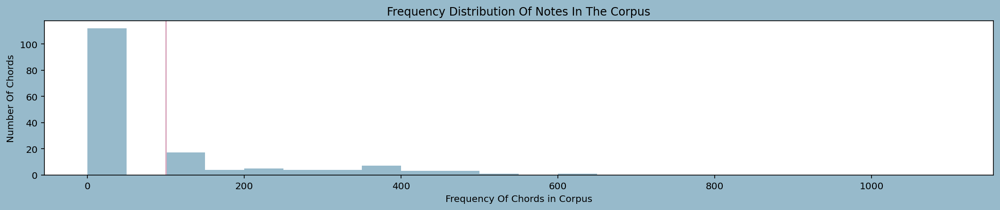

In [ ]:
# Plotting the distribution of Notes
plt.figure(figsize=(18,3),facecolor="#97BACB")
bins = np.arange(0,(max(Recurrence)), 50) 
plt.hist(Recurrence, bins=bins, color="#97BACB")
plt.axvline(x=100,color="#DBACC1")
plt.title("Frequency Distribution Of Notes In The Corpus")
plt.xlabel("Frequency Of Chords in Corpus")
plt.ylabel("Number Of Chords")
plt.show()

In [ ]:
#Getting a list of rare chords
rare_note = []
for index, (key, value) in enumerate(count_num.items()):
    if value < 100:
        m =  key
        rare_note.append(m)
        
print("Total number of notes that occur less than 100 times:", len(rare_note))

Total number of notes that occur less than 100 times: 112


In [ ]:
#Eliminating the rare notes
for element in Corpus:
    if element in rare_note:
        Corpus.remove(element)

print("Length of Corpus after elemination the rare notes:", len(Corpus))

Length of Corpus after elemination the rare notes: 14069


Finally! This is the cleaned data Corpus that I will be using for the music generation.

In the next section, I will be preprocessing this Corpus for the training model.

Notes are basically sound waves. In music, we have certain specific combinations of Frequency and Wavelength standardized as said notes. Our Corpus has the name of that note. As we parsed the data at the time of loading we took the help of the music21 library (by nice people at MIT); The library fetches Frequency, Wavelength, duration etc for the given notes.

In this section, I will be performing the following:

Creating a dictionary: Creating a dictionary to map the notes and their indices. We have the note's name as a string the Corpus. For the computer, these names are just a symbol. So we create a dictionary to map each unique note in our Corpus to a number. And vice versa to retrieve the values at the time of prediction. This will be used to encode and decode the information going in and getting out of the RNN.

Encoding and Splitting the corpus: Encoding and splitting the corpus into smaller sequences of equal length: At this point, the Corpus contain notes. We will encode this corpus and create small sequences of equal lengths of features and the corresponding targets. Each feature and target will contain the mapped index in the dictionary of the unique characters they signify.

Assigning X and y: The labels are then resized and normalized. Whereas the targets are one-hot encoded. Ready to be sent to the RNN for the training, but before that let us built the RNN model.

Splitting Train and Seed datasets To create music we will need to send some input to the RNN. For that, we will set aside a part of the data as seeds. We could have trained it all but I am no musician to come up with an input seed value.

Creating a list of sorted unique characters

In [ ]:
# Storing all the unique characters present in my corpus to bult a mapping dic. 
symb = sorted(list(set(Corpus)))

L_corpus = len(Corpus) #length of corpus
L_symb = len(symb) #length of total unique characters

#Building dictionary to access the vocabulary from indices and vice versa
mapping = dict((c, i) for i, c in enumerate(symb))
reverse_mapping = dict((i, c) for i, c in enumerate(symb))

print("Total number of characters:", L_corpus)
print("Number of unique characters:", L_symb)

Total number of characters: 14069
Number of unique characters: 121


**Encoding and Splitting the Corpus as Labels and Targets**

In [ ]:
#Splitting the Corpus in equal length of strings and output target
length = 40
features = []
targets = []
for i in range(0, L_corpus - length, 1):
    feature = Corpus[i:i + length]
    target = Corpus[i + length]
    features.append([mapping[j] for j in feature])
    targets.append(mapping[target])
    
    
L_datapoints = len(targets)
print("Total number of sequences in the Corpus:", L_datapoints)

Total number of sequences in the Corpus: 14029


In [ ]:
# reshape X and normalize
X = (np.reshape(features, (L_datapoints, length, 1)))/ float(L_symb)
# one hot encode the output variable
y = tf.keras.utils.to_categorical(targets) 

In [ ]:
#Taking out a subset of data to be used as seed
X_train, X_seed, y_train, y_seed = train_test_split(X, y, test_size=0.2, random_state=42)

<h3>Model Building</h3>

In [ ]:
#Initialising the Model
model = Sequential()

#Adding layers
model.add(LSTM(512, input_shape=(X.shape[1], X.shape[2]), return_sequences=True))
model.add(Dropout(0.1))
model.add(LSTM(256))
model.add(Dense(256))
model.add(Dropout(0.1))
model.add(Dense(y.shape[1], activation='softmax'))  # output

#Compiling the model for training  
model.compile(loss='categorical_crossentropy', optimizer='adam')

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (None, 40, 512)           1052672   
                                                                 
 dropout_2 (Dropout)         (None, 40, 512)           0         
                                                                 
 lstm_3 (LSTM)               (None, 256)               787456    
                                                                 
 dense_2 (Dense)             (None, 256)               65792     
                                                                 
 dropout_3 (Dropout)         (None, 256)               0         
                                                                 
 dense_3 (Dense)             (None, 121)               31097     
                                                                 
Total params: 1,937,017
Trainable params: 1,937,017
No

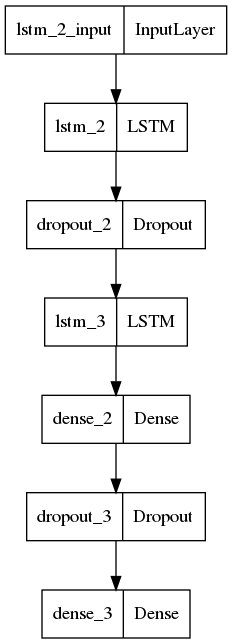

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model, to_file='music.png')

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
early_stop = EarlyStopping(monitor='loss', patience=6, mode='min')

In [ ]:
model.fit(X_train, y_train, batch_size=64, epochs=200, callbacks=[early_stop])

Epoch 1/200
176/176 [==============================] - 6s 15ms/step - loss: 3.8869
Epoch 2/200
176/176 [==============================] - 2s 14ms/step - loss: 3.7349
Epoch 3/200
176/176 [==============================] - 2s 14ms/step - loss: 3.6876
Epoch 4/200
176/176 [==============================] - 2s 14ms/step - loss: 3.6649
Epoch 5/200
176/176 [==============================] - 3s 14ms/step - loss: 3.6406
Epoch 6/200
176/176 [==============================] - 3s 14ms/step - loss: 3.6109
Epoch 7/200
176/176 [==============================] - 3s 14ms/step - loss: 3.5701
Epoch 8/200
176/176 [==============================] - 3s 14ms/step - loss: 3.5259
Epoch 9/200
176/176 [==============================] - 2s 14ms/step - loss: 3.4742
Epoch 10/200
176/176 [==============================] - 3s 14ms/step - loss: 3.4111
Epoch 11/200
176/176 [==============================] - 3s 14ms/step - loss: 3.3232
Epoch 12/200
176/176 [==============================] - 3s 14ms/step - loss: 3.2130
E

In [ ]:
metrics = pd.DataFrame(model.history.history)
metrics

,loss
0,3.886892
1,3.734935
2,3.687604
3,3.664908
4,3.640645
...,...
58,0.143965
59,0.156553
60,0.120919
61,0.121515


Model Evaluation

[Text(0.5, 0, 'Epochs')]

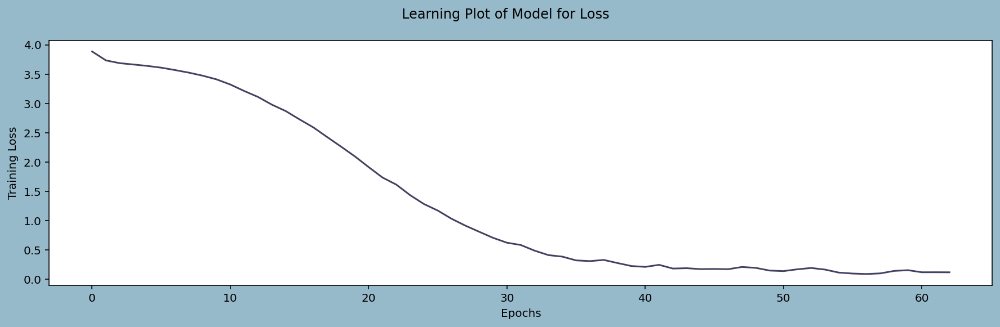

In [ ]:
fig = plt.figure(figsize=(15,4), facecolor="#97BACB")
fig.suptitle("Learning Plot of Model for Loss")
pl=sns.lineplot(data=metrics["loss"],color="#444160")
pl.set(ylabel ="Training Loss")
pl.set(xlabel ="Epochs")

**generating the melody**

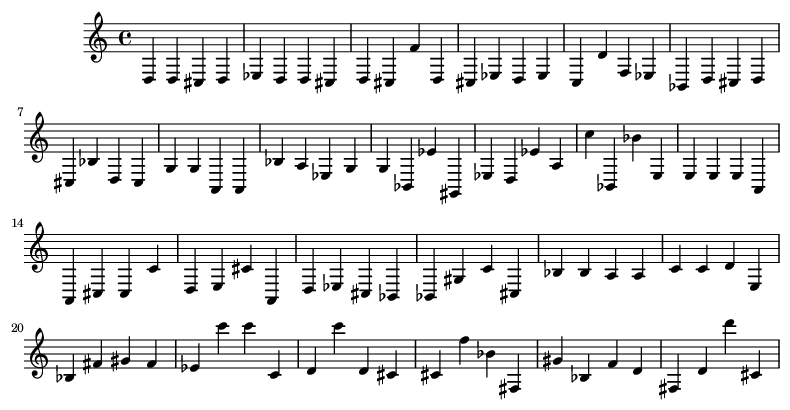

In [ ]:
def Malody_Generator(Note_Count):
    seed = X_seed[np.random.randint(0,len(X_seed)-1)]
    Music = ""
    Notes_Generated=[]
    for i in range(Note_Count):
        seed = seed.reshape(1,length,1)
        prediction = model.predict(seed, verbose=0)[0]
        prediction = np.log(prediction) / 1.0 #diversity
        exp_preds = np.exp(prediction)
        prediction = exp_preds / np.sum(exp_preds)
        index = np.argmax(prediction)
        index_N = index/ float(L_symb)   
        Notes_Generated.append(index)   # stores index value of normalised predicted values
        Music = [reverse_mapping[char] for char in Notes_Generated]
        seed = np.insert(seed[0],len(seed[0]),index_N)
        seed = seed[1:]
    #Now, we have music in form or a list of chords and notes and we want to be a midi file.
    Melody = chords_n_notes(Music)
    Melody_midi = stream.Stream(Melody)   
    return Music,Melody_midi


#getting the Notes and Melody created by the model
Music_notes, Melody = Malody_Generator(100)
show(Melody)

In [ ]:
#To save the generated melody
Melody.write('midi','Melody_Generated.mid')

'Melody_Generated.mid'

In [ ]:
IPython.display.Audio("/content/output2.wav")

In [ ]:
from midi2audio import FluidSynth
fs = FluidSynth()
fs.midi_to_audio('/content/Melody_Generated.mid', '/content/output2.wav')

In [ ]:
!pip install miniaudio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 551 kB 5.3 MB/s 


In [ ]:
from playsound import playsound
playsound('/content/output2.wav')

CalledProcessError: ignored

In [ ]:
!pip install pygobject

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
